Section 1) Summary of your project (10%)


I wanted to implement the sentiment analysis on the IMDB reviews of Interstellar Movie. Sentimental analysis is essential because it tracks the sentiments in real-time. It's used to improve customer service and to boost your product and services. It's also used to do better in marketing campaigns and monitor the brand perception. Sentiment analysis enables you to respond to problems promptly before the customer leaves you altogether!
  I harvested from the IMDB reviews; I chose a supervised ML model(Logistic Regression, Decision Tree Classifier, Random Forest Classifier, K Neighbors Classifier, and Support Vector Machine). I harvested my data set; then I text normalized, tokenized, converted the Alphanumeric characters and decimals into characters, removed contractions, converted all words to lowercase, dropped unnecessary columns, removed additional characters from the data frame, Lemmatization of the text column, removed the stopwords from the data frame, visualized the highest repeating words in the data frame using the word cloud, Visualized top 10 repeated/common words using a bar graph, printed 100 positive and negative comments, did Vader sentiment analysis for a given (Sentence) if positive, negative or neutral, Converted all Polarity scores and sentences into a data frame, gave threshold values to classify if a given sentence is positive, negative or neutral, Added the target or sentiment column to our data frame, Removing/dropping the 'neg,' 'neu,' 'pos,' and 'compound' columns, vectorized the trained data and split the dataset.
  My defined success criteria are Model accuracy of train and test data above 90%.

Explain your data set, how it is composed, and how you collected it.

The first step, we will need to import all the necessary libraries:

In [ ]:
!pip install selenium
import pandas as pd #Using panda to create our dataframe
# Import Selenium and its sub libraries
import selenium 
from selenium import webdriver
# Import BS4
import requests #needed to load the page for BS4
from bs4 import BeautifulSoup

/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.7) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


As we chose Chrome as our primary web browser, we will need to download the Chrome driver and tell Selenium where to find it:

In [ ]:
!pip install selenium
!apt-get update 
!apt install chromium-chromedriver
from selenium import webdriver
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome('chromedriver',chrome_options=chrome_options)

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Get:2 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/graph

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: use options instead of chrome_options
  # Remove the CWD from sys.path while we load stuff.


Then we can set up our top100 webpage; it will be the only input we need to feed into the script

In [ ]:
def get_review(url, folder_name):
    '''
    Get the review from input as url for IMDB movies list.
    The function takes 2 input the url of the movies and the name of the folder to store the data
    For each folder, the function will grab the review for each movies and store into respective file.
    '''
    #driver = webdriver.Chrome(PATH) #tell selenium to use Chrome and find the webdriver file in this location
    driver = webdriver.Chrome('chromedriver',chrome_options=chrome_options)
    driver.get(url) #tell Selenium to open the webpage
    driver.implicitly_wait(1) # tell the webdriver to wait for 1 seconds for the page to load
    #After the webpage opened, we can extract the title, hyperlink, year of each movies
    #Set initial empty list for each element:
    title = []
    link = []
    year = []
    #Grab the block of each individual movie
    block = driver.find_elements_by_class_name('lister-item')
    #Set up for loop to run through all 50 movies in the first page
    for i in range(0,50):
        try:
            #Extracting title
            ftitle = block[i].find_element_by_class_name('lister-item-header').text
            #The extracted title has extra elements, so we will have to do some cleaning
            #Remove the order in front of the title
            forder = block[i].find_element_by_class_name('lister-item-index').text
            #Extract the year last 6 letter of the title
            fyear = ftitle[-6:]
            #Drop the order, year and only keep the movie's name
            ftitle = ftitle.replace(forder+' ', '')[:-7 ]
            #Then extract the link with cleaned title
            flink = block[i].find_element_by_link_text(ftitle).get_attribute('href')
            #Add item to the respective lists
            title.append(ftitle)
            year.append(fyear)
            link.append(flink)
        except:
          continue
    # After that, we can use BeautifulSoup to extract the user reviews link 
    #Set an empty list to store user review link
    user_review_links = []
    for url in link:
        url = url
        #setup user agent for BS4, except some rare case, it would be the same for most browser 
        user_agent = {'User-agent': 'Mozilla/5.0'}
        #Use request.get to load the whole page
        response = requests.get(url, headers = user_agent)
        #Parse the request object to BS4 to transform it into html structure
        soup = BeautifulSoup(response.text, 'html.parser')
        #Find the link marked by the USER REVIEWS link text.
        review_link = 'https://www.imdb.com/'+soup.find('a', {"class" : 'isReview'}).get('href')
        #Append the newly grabed link into its list
        user_review_links.append(review_link)
    #Then create the first data frame to summarize our data at this point:
    #Create dictionary for data and columns' name
    top_50_data = {'Movie_name': title, 
            'Year': year, 
            'link': link,
            'user_review' : user_review_links,
            }
    top50 = pd.DataFrame(data = top_50_data) #create dataframe
    driver.quit() #tell Selenium to close the webpage
    # Step 2, we will grab the data from each user review page
    # Use Selenium to go to each user review page
    for i in range(len(top50['user_review'])): 
        driver = webdriver.Chrome('chromedriver',chrome_options=chrome_options)
        driver.get(top50['user_review'][i])
        driver.implicitly_wait(1) # tell the webdriver to wait for 1 seconds for the page to load to prevent blocked by anti spam software
        # Set up action to click on 'load more' button
        # note that each page on imdb has 25 reviews
        page = 1 #Set initial variable for while loop
        #We want at least 1000 review, so get 50 at a safe number
        while page<50:  
            try:
                #find the load more button on the webpage
                load_more = driver.find_element_by_id('load-more-trigger')
                #click on that button
                load_more.click()
                page+=1 #move on to next loadmore button
            except:
                #If couldnt find any button to click, stop
                break
        # After fully expand the page, we will grab data from whole website
        review = driver.find_elements_by_class_name('review-container')
        #Set list for each element:
        title = []
        content = []
        rating = []
        date = []
        user_name = []
        #run for loop to get 
        for n in range(0,1100):
            try:
                #Some reviewers only give review text or rating without the other, 
                #so we use try/except here to make sure each block of content must has all the element before append them to the list
                #Check if each review has all the elements
                ftitle = review[n].find_element_by_class_name('title').text
                #For the review content, some of them are hidden as spoiler, 
                #so we use the attribute 'textContent' here after extracting the 'content' tag
                fcontent = review[n].find_element_by_class_name('content').get_attribute("textContent").strip()
                frating = review[n].find_element_by_class_name('rating-other-user-rating').text
                fdate = review[n].find_element_by_class_name('review-date').text
                fname = review[n].find_element_by_class_name('display-name-link').text
                #Then add them to the respective list
                title.append(ftitle)
                content.append(fcontent)
                rating.append(frating)
                date.append(fdate)
                user_name.append(fname)
            except:
                  continue
        #Build data dictionary for dataframe
        data = {'User_name': user_name, 
            'Review title': title, 
            'Review Rating': rating,
            'Review date' : date,
            'Review_body' : content
           }
        #Build dataframe for each movie to export
        review = pd.DataFrame(data = data)
        movie = top50['Movie_name'][i] #grab the movie name from the top50 list    
        review['Movie_name'] = movie #create new column with the same movie name column    
        review.to_csv(f'{i+1}.csv') #store them into individual file for each movies, so we can combine or check them later
        driver.quit()

Then we can save the newly created raw data frame into a CSV file for future use

In [ ]:
top50_raw_link = 'https://www.imdb.com/search/title/?groups=top_100'
get_review(top50_raw_link, 'top50_raw')

NameError: ignored

My data set is a CSV file of IMDB reviews, and the name of the data set is sharma_week10_data.csv; the data set comprises 7 columns, namely index, User name who has given the Review, Review by the user, Review Rating, Review date, Review_body, and Movie_name. I'll be using Reviews by the user for my sentiment analysis using NLP.

Load of the data set.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set()

df = pd.read_csv("sharma_week10_data.csv")
df.head()

,Unnamed: 0,User_name,Review title,Review Rating,Review date,Review_body,Movie_name
0,0,MartinHafer,Why tack on an ending where everything works o...,8/10,22 February 2015,"The first 80-90% of ""Interstellar"" I absolutel...",Interstellar
1,1,TheLittleSongbird,"Often impressive and very beautiful, but less ...",6/10,21 January 2017,"As someone who likes the cast, loved the conce...",Interstellar
2,2,Leofwine_draca,"Another bloated, overrated space epic",4/10,14 January 2017,"Another outer space film from Hollywood, this ...",Interstellar
3,3,SnoopyStyle,some problems but a few great touches of 2001,7/10,25 June 2015,"In the near future, Earth is devastated by bli...",Interstellar
4,4,Hitchcoc,"Intellectual, Although Sometimes Flawed Scienc...",7/10,19 June 2015,I'm treading on some little used ground. From ...,Interstellar


Show me your data!!!!!!!

Importing necessary libraries

In [ ]:
import matplotlib.cm as cm
from matplotlib import rcParams
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import re
import nltk
import string
import nlp_utils
import collections
import contractions
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1066 entries, 0 to 1065
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Unnamed: 0     1066 non-null   int64 
 1   User_name      1066 non-null   object
 2   Review title   1066 non-null   object
 3   Review Rating  1066 non-null   object
 4   Review date    1066 non-null   object
 5   Review_body    1066 non-null   object
 6   Movie_name     1066 non-null   object
dtypes: int64(1), object(6)
memory usage: 58.4+ KB


In [ ]:
df.drop("User_name",axis=1,inplace=True)
# dropping unnecessary columns.

In [ ]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [ ]:
df.drop("Review title",axis=1,inplace=True)

In [ ]:
df.drop("Review Rating",axis=1,inplace=True)

In [ ]:
df.drop("Review date",axis=1,inplace=True)

In [ ]:
df.drop("Movie_name",axis=1,inplace=True)

In [ ]:
df

,Review_body
0,"The first 80-90% of ""Interstellar"" I absolutel..."
1,"As someone who likes the cast, loved the conce..."
2,"Another outer space film from Hollywood, this ..."
3,"In the near future, Earth is devastated by bli..."
4,I'm treading on some little used ground. From ...
...,...
1061,SPOILER FREE BEGINS *********I had a sneaking ...
1062,Being a movie by Christoper Nolan you can expe...
1063,Interstellar is one of the most profound exper...
1064,My view for what it's worth. Watch it....then ...


In [ ]:
df= df.rename(columns={0: 'Text'})
# Renaming the column 0 as 'Text'

In [ ]:
# Loading data. 
with open('sharma_week10_data.csv','r') as f:
    text = f.read()

### The data is in the form of a text.

In [ ]:
text

',User_name,Review title,Review Rating,Review date,Review_body,Movie_name\n0,MartinHafer,Why tack on an ending where everything works out perfectly?!,8/10,22 February 2015,"The first 80-90% of ""Interstellar"" I absolutely loved and was prepared to give this movie a 10. Sadly, the ending inexplicably had an ending that didn\'t make a lot of sense and only seemed there in order to tack on a nice Hollywood ending and wrap everything up perfectly. It\'s sad, but apparently the public embraced this sort of ending...so who am I to complain?!As for the film, there are a bazillion reviews so I will be brief. The film has incredible special effects and is a film best seen in the movie theater. On a HUGE screen at home, it would still lose something. Like the wonderful ""Gravity"", it just needs the big screen...trust me with this. The story is exceptional and offers many wonderful twists (up until the disappointing ending that is) and there are a lot of wonderful performances. Overall, the goo

Text Normalization: ### Text normalization is the process of transforming a text into a canonical (standard) form. For example, the word “gooood” and “gud” can be changed to “good,” its canonical form. Another example is the mapping of near-identical words such as “stopwords,” “stop-words,” and “stop words” to just “stopwords.”

Text Normalization

In [ ]:
# splitting at ( \n ).
text=text.split('\n')
# Separating at new line using '\n'

In [ ]:
# splitting at ( \t ).
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))
# Splitting String by tab(\t)    

In [ ]:
letters_only = re.sub(r'[^a-zA-Z]',  
                          " ",          
                          str(corpus))
# Taking only letters

### Tokenization
What is Tokenization?
Tokenization is the process by which a large quantity of text is divided into smaller parts called tokens.

Natural language processing is used for building applications such as Text classification, intelligent chatbot, sentimental analysis, language translation, etc. It becomes vital to understand the pattern in the text to achieve the above-stated purpose. These tokens are handy for finding such practices and are considered a base step for stemming and lemmatization.

Sentence tokenization is the process of splitting text into individual sentences. ... It does this by looking for the types of textual constructs that confuse the tokenizer and replacing them with single words.

In [ ]:
# converting to lowercase.
letters_only=letters_only.lower()

token=nltk.sent_tokenize(letters_only)
token

['    user name review title review rating review date review body movie name      martinhafer why tack on an ending where everything works out perfectly           february       the first        of   interstellar   i absolutely loved and was prepared to give this movie a     sadly  the ending inexplicably had an ending that didn  t make a lot of sense and only seemed there in order to tack on a nice hollywood ending and wrap everything up perfectly  it  s sad  but apparently the public embraced this sort of ending   so who am i to complain  as for the film  there are a bazillion reviews so i will be brief  the film has incredible special effects and is a film best seen in the movie theater  on a huge screen at home  it would still lose something  like the wonderful   gravity    it just needs the big screen   trust me with this  the story is exceptional and offers many wonderful twists  up until the disappointing ending that is  and there are a lot of wonderful performances  overall  t

Alphanumeric characters

In [ ]:
def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = word_tokenize(token)
    map_list = list(map(num_dec_al,tokens))
    return " ".join(map_list)

corpus_nda = list(map(clean_nda,token))

corpus_nda
### Alpha numeric characters and decimals have been replaced with characters

['user name review title review rating review date review body movie name martinhafer why tack on an ending where everything works out perfectly february the first of interstellar i absolutely loved and was prepared to give this movie a sadly the ending inexplicably had an ending that didn t make a lot of sense and only seemed there in order to tack on a nice hollywood ending and wrap everything up perfectly it s sad but apparently the public embraced this sort of ending so who am i to complain as for the film there are a bazillion reviews so i will be brief the film has incredible special effects and is a film best seen in the movie theater on a huge screen at home it would still lose something like the wonderful gravity it just needs the big screen trust me with this the story is exceptional and offers many wonderful twists up until the disappointing ending that is and there are a lot of wonderful performances overall the good certainly outweighs the bad and it s a film to see but as

### Removing Contractions.
It is a process where words like isn't, didn't are expanded to is not did not. 
isn't --> is not, 
I'm --> I am, 
they're --> they are,
shouldn't --> should not,
can't --> can not

In [ ]:
conm = contractions
def contraction_remove(corpus_nda):
    for key,value in conm.items():
        corpus_nda = re.sub(r"{}".format(key),'{}'.format(value),corpus_nda)
        
    return corpus_nda

special = string.punctuation
def w_tokenization(corpus_nda):
    # convert into lower case
    corpus_nda = corpus_nda.lower()
    # contraction
    corpus_nda = contraction_remove(corpus_nda)
    # 
    tokens = nltk.word_tokenize(corpus_nda) # word tokens
## contractions have been expanded and the letters have been converted to lowercase.    

In [ ]:
corpus_nda
## corpus_nda with expanded contractions and converted to lowercase.    

['user name review title review rating review date review body movie name martinhafer why tack on an ending where everything works out perfectly february the first of interstellar i absolutely loved and was prepared to give this movie a sadly the ending inexplicably had an ending that didn t make a lot of sense and only seemed there in order to tack on a nice hollywood ending and wrap everything up perfectly it s sad but apparently the public embraced this sort of ending so who am i to complain as for the film there are a bazillion reviews so i will be brief the film has incredible special effects and is a film best seen in the movie theater on a huge screen at home it would still lose something like the wonderful gravity it just needs the big screen trust me with this the story is exceptional and offers many wonderful twists up until the disappointing ending that is and there are a lot of wonderful performances overall the good certainly outweighs the bad and it s a film to see but as

In [ ]:
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))
# Separating at tab     

In [ ]:
data.append(sent.split('\n'))
# Separating at newline

In [ ]:
data
# Cleaned text

[['user name review title review rating review date review body movie name martinhafer why tack on an ending where everything works out perfectly february the first of interstellar i absolutely loved and was prepared to give this movie a sadly the ending inexplicably had an ending that didn t make a lot of sense and only seemed there in order to tack on a nice hollywood ending and wrap everything up perfectly it s sad but apparently the public embraced this sort of ending so who am i to complain as for the film there are a bazillion reviews so i will be brief the film has incredible special effects and is a film best seen in the movie theater on a huge screen at home it would still lose something like the wonderful gravity it just needs the big screen trust me with this the story is exceptional and offers many wonderful twists up until the disappointing ending that is and there are a lot of wonderful performances overall the good certainly outweighs the bad and it s a film to see but a

In [ ]:
df = pd.DataFrame(data)
## Saving the data into a dataframe.

In [ ]:
df= df.rename(columns={0: 'Text'})
# Renaming the column 0 as 'Text'

### Removing additional characters present in the data frame.

In [ ]:
## We can further see that there are still some special characters in the dataframe which have to be treated.
df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

In [ ]:
df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip(')')
df['Text'] = df['Text'].str.strip('(')
## Using the strip function in order to delete the special characters.

## Lemmatization of the text column: Lemmatization usually refers to doing things properly using a vocabulary and morphological analysis of words, generally aiming to remove inflectional endings only and to return the base or dictionary from a word which is known as the lemma. Lemmatization will generate the root form of the inflected words

In [ ]:
Text=df['Text']

In [ ]:
token=nltk.sent_tokenize(str(token))
## Sentence tokenization

In [ ]:
data = np.array(token)
## Saving token in form of array

In [ ]:
stop = stopwords.words('english')
## Saving stopwords in stop

### Removing stopwords from the data frame

In [ ]:
text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)   
## Removing stopwords from the text and printing the words without stopwords

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Visualization

In [ ]:
stopwords = set(stopwords.words("english"))
## Removing stopwords for wordcloud visualization

In [ ]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))
## WordCloud is a technique to show which words are the most frequent among the given text

### Visualizing the highest repeating words in the data frame using the word cloud.

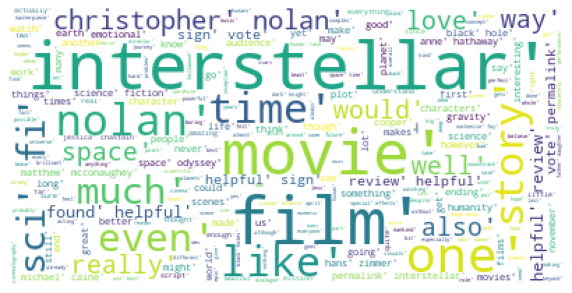

In [ ]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Counting the number of times a word has repeated throughout the data.

In [ ]:
tokens_without_sw=(str(tokens_without_sw))

In [ ]:
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)
# Removing stopwords as creating two lists to display the words and their counts    

In [ ]:
counted_words.most_common(100) # the word 'interstellar' has repeated for 5390 times.

[("'interstellar',", 5390),
 ("'movie',", 5228),
 ("'film',", 5076),
 ("'nolan',", 3678),
 ("'space',", 3084),
 ("'time',", 2788),
 ("'one',", 2700),
 ("'like',", 2368),
 ("'story',", 1662),
 ("'helpful',", 1652),
 ("'cooper',", 1640),
 ("'earth',", 1498),
 ("'good',", 1496),
 ("'really',", 1438),
 ("'science',", 1404),
 ("'much',", 1368),
 ("'even',", 1364),
 ("'best',", 1282),
 ("'would',", 1274),
 ("'mcconaughey',", 1272),
 ("'great',", 1232),
 ("'well',", 1220),
 ("'also',", 1144),
 ("'found',", 1136),
 ("'christopher',", 1090),
 ("'planet',", 1086),
 ("'love',", 1080),
 ("'review',", 1058),
 ("'could',", 1056),
 ("'sci',", 1046),
 ("'fi',", 1034),
 ("'see',", 1022),
 ("'make',", 1010),
 ("'way',", 1006),
 ("'plot',", 952),
 ("'daughter',", 940),
 ("'many',", 918),
 ("'get',", 916),
 ("'movies',", 906),
 ("'films',", 904),
 ("'go',", 900),
 ("'human',", 892),
 ("'matthew',", 880),
 ("'people',", 850),
 ("'sign',", 842),
 ("'black',", 842),
 ("'vote',", 834),
 ("'think',", 832),
 ("

# Visualizing top 10 repeated/common words using a bar graph.

<BarContainer object of 10 artists>

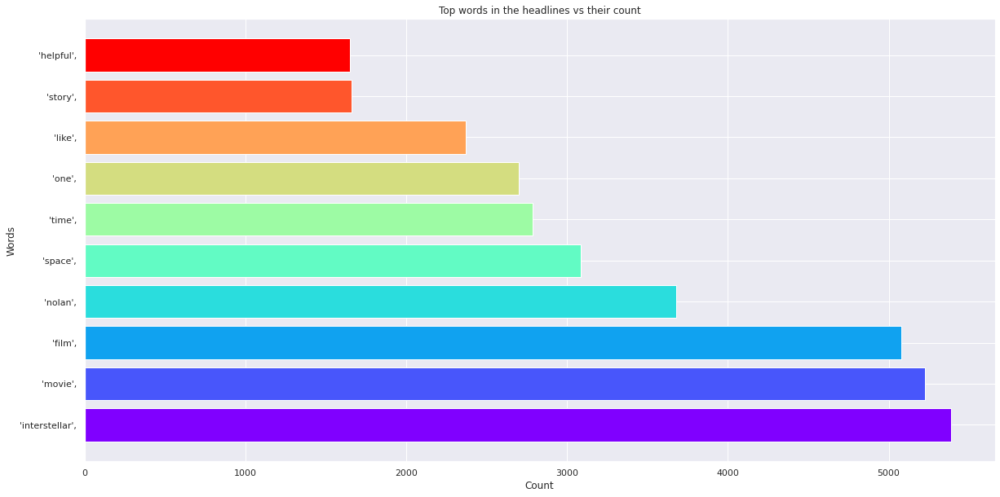

In [ ]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

# Sentiment Analysis.

### Vader sentiment analysis is done to find if a given (Word) is positive, negative, or neutral.
VADER belongs to a type of sentiment analysis that is based on lexicons of sentiment-related words. In this approach, each of the words in the dictionary is rated as to whether it is positive or negative and how positive or negative in many cases. Below you can see an excerpt from VADER’s lexicon, where more positive words have higher positive ratings and more negative words have lower negative ratings.
Vader sentiment analysis for a given (word) if positive, negative, or neutral.

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:        
        neu_word_list.append(word)                

### Top 100 Positive words.

In [ ]:
print(list(iter(pos_word_list[:100]))) # These are the top 100 positive words found in the dataset.

["'perfectly", "'loved", "'prepared", "'nice", "'perfectly", "'special", "'best", "'huge", "'like", "'wonderful", "'trust", "'wonderful", "'wonderful", "'good", "'certainly", "'okay", "'impressive", "'beautiful", "'likes", "'loved", "'talented", "'enjoyed", "'good", "'great", "'admires", "'praises", "'audacious", "'fantastic", "'special", "'best", "'heart", "'inspiring", "'fascinating", "'heart", "'emotional", "'beautifully", "'heartfelt", "'great", "'strong", "'flawless", "'best", "'committed", "'beautifully", "'fine", "'support", "'fine", "'strong", "'idealistic", "'better", "'impressive", "'beautiful", "'beautifully", "'thankfully", "'better", "'intelligent", "'best", "'interesting", "'sentimentalism", "'like", "'highlight", "'adventure", "'like", "'good", "'great", "'surviving", "'like", "'save", "'like", "'better", "'like", "'like", "'best", "'awesome", "'intellectual", "'challenging", "'interesting", "'solution", "'kind", "'sentimental", "'worth", "'interest", "'helpful", "'helpf

### Top 100 Negative words.

In [ ]:
print(list(iter(neg_word_list[:100]))) # These are the top 100 negative words found in the dataset.

["'sadly", "'sad", "'complain", "'lose", "'disappointing", "'bad", "'sadness", "'haunting", "'provoking", "'provoking", "'confused", "'forced", "'critics", "'dullard", "'problems", "'devastated", "'problems", "'sabotage", "'problems", "'problems", "'problems", "'conflict", "'lose", "'lost", "'nagging", "'problems", "'flawed", "'confusing", "'war", "'blamed", "'destroyed", "'problem", "'limited", "'mess", "'problem", "'hard", "'alone", "'criticism", "'odd", "'hate", "'boring", "'alone", "'lost", "'fake", "'ghost", "'sad", "'bored", "'wrong", "'hurt", "'apocalyptic", "'destroying", "'ghost", "'dangerous", "'nonsense", "'bad", "'suspended", "'hard", "'lost", "'missing", "'anti", "'problem", "'screams", "'killing", "'stop", "'risk", "'terrifying", "'lies", "'deceit", "'rant", "'wrong", "'mistaken", "'hurt", "'wrong", "'hater", "'widowed", "'haunted", "'ghost", "'devastated", "'bad", "'severe", "'killed", "'delayed", "'death", "'problem", "'tense", "'madness", "'die", "'killed", "'bomb", "'

In [ ]:
df

,Text
0,user name review title review rating review da...
1,User_nameReview titleReview RatingReview dateR...
2,MartinHaferWhy tack on an ending where everyth...
3,TheLittleSongbirdOften impressive and very bea...
4,Leofwine_dracaAnother bloated overrated space ...
...,...
4178,
4179,PermalinkInterstellar
4180,avzwamMore below averageness from Nolan/ Novem...
4181,


## Vader sentiment analysis for a given (Sentence) if positive, negative or neutral.

In [ ]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
     print(sentence)
        
     ss = sid.polarity_scores(sentence)
     for k in ss:
         print('{0}: {1}, ' .format(k, ss[k]), end='')
     print()

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
ryanwinningInterstellar: A thought provoking gem! // March I cant put my finger on why but I shed tears during this movie at more points than any other movie Ive watched. The moral of the story is that life is a process of constantly making decisions. You can make intellectual decisions decisions out of love or decisions just for survival. Most of the time when you play it smart and try to do the intelligent thing youll still miscalculate something and make a mistake. As hard as it is its always better in the end if you follow your heart and chase the feeling of love. Decisions for survival is by any means necessary. You can lie or cheat for survival and do whatever you have to do. Its ironic that McCaughnahey doesnt want any of the important people in his life to ever feel like theyre alone yet hes willing to travel deep into space all alone as a sacrifice for others.
neg: 0.098, neu: 0.689, pos: 0.213, compound: 0.9845, 
            

### Converting all Polarity scores and sentences into a data frame.

In [ ]:
analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)
### Creating a dataframe.

In [ ]:
df.head()

,Text,neg,neu,pos,compound
0,user name review title review rating review da...,0.067,0.760,0.173,1.0000
1,User_nameReview titleReview RatingReview dateR...,0.000,1.000,0.000,0.0000
2,MartinHaferWhy tack on an ending where everyth...,0.089,0.691,0.220,0.9854
3,TheLittleSongbirdOften impressive and very bea...,0.029,0.695,0.277,0.9992
4,Leofwine_dracaAnother bloated overrated space ...,0.025,0.858,0.117,0.9718


## Arranging the dataset in descending order based on (Compound score) to find the most crucial sentence from the given data.

In [ ]:
imp_sent=df.sort_values(by='compound', ascending=False)
## arranging the compound column in descending order to find the best sentence. 

## Finding maximum positive sentence in the data.

In [ ]:
pos_sent=df.sort_values(by='pos', ascending=False)
## Arranging the dataframe by positive column in descending order to find the best postive sentence.

## Finding maximum negative sentence in the data.

In [ ]:
neg_sent=df.sort_values(by='neg', ascending=False)
## Arranging the dataframe by negative column in descending order to find the best negative sentence.

In [ ]:
neg_sent

,Text,neg,neu,pos,compound
3391,Rage rage against the dying of the light.Inter...,0.545,0.455,0.000,-0.8020
4127,Not even good acted.,0.445,0.555,0.000,-0.3412
3388,Rage rage against the dying of the light.And y...,0.442,0.558,0.000,-0.8834
1350,I would kill to see this in theatres.,0.402,0.598,0.000,-0.6908
805,The giant wave and Cooper very furious with he...,0.333,0.667,0.000,-0.6115
...,...,...,...,...,...
1673,out of found this helpful.,0.000,0.552,0.448,0.5023
1674,,0.000,0.000,0.000,0.0000
1675,Was this review he...,0.000,0.714,0.286,0.4215
1676,,0.000,0.000,0.000,0.0000


In [ ]:
sentences=df

## Giving threshold values to classify if a given sentence is positive, negative, or neutral.

In [ ]:
#Assigning score categories and logic
i = 0

predicted_value = [ ] #empty series to hold our predicted values

while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1
## The threshold value will categorize if a given sentence is positive negative or neutral in nature.        

In [ ]:
predicted_value

['positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'neutral',
 'negative',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'negat

### Adding the target or sentiment column to our data frame.

In [ ]:
df['Target'] = predicted_value 
## A new column has been created called as 'Target' with sentiments assigned to a given text.

In [ ]:
df.head()

,Text,neg,neu,pos,compound,Target
0,user name review title review rating review da...,0.067,0.760,0.173,1.0000,positive
1,User_nameReview titleReview RatingReview dateR...,0.000,1.000,0.000,0.0000,negative
2,MartinHaferWhy tack on an ending where everyth...,0.089,0.691,0.220,0.9854,positive
3,TheLittleSongbirdOften impressive and very bea...,0.029,0.695,0.277,0.9992,positive
4,Leofwine_dracaAnother bloated overrated space ...,0.025,0.858,0.117,0.9718,positive


### Removing/dropping the 'neg', 'neu', 'pos', and 'compound' columns.

In [ ]:
df.drop(['neg','neu','pos','compound'],axis=1,inplace=True)
## Dropping the neg, neu, pos, and compound columns.

In [ ]:
df
## Final dataframe with sentiments.

,Text,Target
0,user name review title review rating review da...,positive
1,User_nameReview titleReview RatingReview dateR...,negative
2,MartinHaferWhy tack on an ending where everyth...,positive
3,TheLittleSongbirdOften impressive and very bea...,positive
4,Leofwine_dracaAnother bloated overrated space ...,positive
...,...,...
4178,,negative
4179,PermalinkInterstellar,negative
4180,avzwamMore below averageness from Nolan/ Novem...,positive
4181,,negative


In [ ]:
df['Target'].value_counts()
### There are 1375 positive, 2317 negative and 491 neutral columns present in the dataset.

negative    2317
positive    1375
neutral      491
Name: Target, dtype: int64

In [ ]:
cat_cols=['Target']
le=LabelEncoder()
for i in cat_cols:
    df[i]=le.fit_transform(df[i])
df.dtypes
### Label Encoding the target column.

Text      object
Target     int64
dtype: object

In [ ]:
df['Target'].value_counts()
## Label encoded value_counts()

0    2317
2    1375
1     491
Name: Target, dtype: int64

In [ ]:
df

,Text,Target
0,user name review title review rating review da...,2
1,User_nameReview titleReview RatingReview dateR...,0
2,MartinHaferWhy tack on an ending where everyth...,2
3,TheLittleSongbirdOften impressive and very bea...,2
4,Leofwine_dracaAnother bloated overrated space ...,2
...,...,...
4178,,0
4179,PermalinkInterstellar,0
4180,avzwamMore below averageness from Nolan/ Novem...,2
4181,,0


Section 2) Show the code and architecture of your ML


In [ ]:
# Vectorizing training data. 
tfidf = TfidfVectorizer() 
X = tfidf.fit_transform(df['Text'])
Y = df['Target']
## Applying Tf-Idf vectorizer on the Text column.

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)
### Splitting the dataset.

(3346, 17617) (837, 17617) (3346,) (837,)


Show the output of your model training with your harvested data set

### Logistic Regression
Logistic Regression is used when the dependent variable(target) is categorical.

In [ ]:
log_reg = LogisticRegression().fit(X_train, Y_train)

#predict on train 
train_preds = log_reg.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds))

#predict on test
test_preds = log_reg.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds))

Model accuracy on train is:  0.9485953377166766
Model accuracy on test is:  0.929510155316607


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score, roc_curve, recall_score

## Decision Tree Classifier
A Decision Tree is a Supervised Machine Learning Algorithm that uses a set of rules to make decisions, similar to how humans make decisions.

In [ ]:
DT = DecisionTreeClassifier().fit(X,Y)

In [ ]:
#predict on train 
train_preds2 = DT.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds2))

#predict on test
test_preds2 = DT.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds2))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds2))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds2))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds2).sum(),'/',((Y_test == test_preds2).sum()+(Y_test != test_preds2).sum()))
print('-'*50)

# Kappa Score
print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,test_preds2))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[1813    0    0]
 [   0  407    0]
 [   0    0 1126]]
confusion_matrix test is:  [[504   0   0]
 [  0  84   0]
 [  0   0 249]]
Wrong predictions out of total
--------------------------------------------------
0 / 837
--------------------------------------------------
KappaScore is:  1.0


Random Forest Classifier
Random forests are supervised learning algorithms. It can be used both for classification and regression. It is also the most flexible and easy-to-use algorithm. A forest is comprised of trees. It is said that the more trees it has, the more robust a forest is. Random forests create decision trees on randomly selected data samples, get a prediction from each tree, and set the best solution using voting. It also provides a pretty good indicator of the feature importance.

In [ ]:
#fit the model on train data 
RF=RandomForestClassifier().fit(X_train,Y_train)
#predict on train 
train_preds3 = RF.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds3))

#predict on test
test_preds3 = RF.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds3))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds3))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds3))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds3).sum(),'/',((Y_test == test_preds3).sum()+(Y_test != test_preds3).sum()))
print('-'*50)

Model accuracy on train is:  1.0
Model accuracy on test is:  0.9366786140979689
--------------------------------------------------
confusion_matrix train is:  [[1813    0    0]
 [   0  407    0]
 [   0    0 1126]]
confusion_matrix test is:  [[468   0  36]
 [  2  72  10]
 [  5   0 244]]
Wrong predictions out of total
--------------------------------------------------
53 / 837
--------------------------------------------------


K Neighbors Classifier
The k-nearest neighbors (KNN) algorithm is a simple, easy-to-implement supervised machine learning algorithm that can be used to solve both classification and regression problems.

In [ ]:
#fit the model on train data 
KNN = KNeighborsClassifier().fit(X_train,Y_train)
#predict on train 
train_preds4 = KNN.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds4))

#predict on test
test_preds4 = KNN.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds4))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds4))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds4))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds4).sum(),'/',((Y_test == test_preds4).sum()+(Y_test != test_preds4).sum()))
print('-'*50)

Model accuracy on train is:  0.8544530783024507
Model accuracy on test is:  0.8590203106332138
--------------------------------------------------
confusion_matrix train is:  [[1775    0   38]
 [  56  340   11]
 [ 382    0  744]]
confusion_matrix test is:  [[490   0  14]
 [  9  71   4]
 [ 91   0 158]]
Wrong predictions out of total
--------------------------------------------------
118 / 837
--------------------------------------------------


# Support Vector Machine
The objective of the support vector machine algorithm is to find a hyperplane in N-dimensional space(N — the number of features) that distinctly classifies the data points.

In [ ]:
#fit the model on train data 
SVM = SVC(kernel='linear')
SVM.fit(X_train, Y_train)

#predict on train 
train_preds5 = SVM.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds5))

#predict on test
test_preds5 = SVM.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds5))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds5))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds5))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds5).sum(),'/',((Y_test == test_preds5).sum()+(Y_test != test_preds5).sum()))
print('-'*50)

Model accuracy on train is:  0.9668260609683204
Model accuracy on test is:  0.9414575866188769
--------------------------------------------------
confusion_matrix train is:  [[1757    0   56]
 [  15  353   39]
 [   1    0 1125]]
confusion_matrix test is:  [[479   0  25]
 [  2  71  11]
 [ 11   0 238]]
Wrong predictions out of total
--------------------------------------------------
49 / 837
--------------------------------------------------


Section 5) Inference test of your model
My model recognizes if the sentence is positive, negative, and neutral. There are 1375 positive, 2317 negative, and 491 neutral columns present in the dataset.
To test inference, I divided the data into train and test and ran my ML model. Given my definition of success criteria, I should have 90% or greater chances of asserting.

Section 6) Summary
I think I was successful in training my model. The logistic regression had 94% for the train, 92% for the test, and The SVM had 96% for the train and 94% for the test.  My success criteria were above 90%, and my model performed well for logistic regression and Support vector machines. For the decision tree, the model was overfitting. The random forest classifier performed well, too, with 100% for the train and 93% for the test. The KNN didn't perform well and was below my expectation of the model of 90%. The hardest part was the Sentiment Intensity Analyzer. It took approx 10 hours each time I ran the model and the same time for converting all polarity scores and sentences into a data frame. It took me a couple of days to finally get through it, and I'm happy that I trained my model. 